# Yelp Open Dataset - Exploratory Data Analsyis

This is an EDA of the [Yelp Open Dataset](https://www.yelp.com/dataset). JSON format. Consists of 5 datasets: Businesses, Users, Reviews, Tips, and Checkins.

The Users and Reviews files are too large to load into a Jupyter notebook without crashing the kernel, so we use a Dask Cluster to perform the processing for us.

In [1]:
from dask.distributed import Client
cluster = Client("tcp://dc-eddyb-yelpdb-a02061631aed465281ba60018e829106.main-namespace:8786")
cluster

<Client: 'tcp://192.168.110.2:8786' processes=12 threads=24, memory=177.42 GiB>

In [2]:
import pandas as pd
import seaborn as sns
import networkx as nx
import numpy as np
import geopandas as gpd 
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter
import heapq
from mpl_toolkits.basemap import Basemap

In [3]:
business = pd.read_json("yelp_academic_dataset_business.json", lines=True)
user = pd.read_json("yelp_academic_dataset_user.json", lines=True)
review = pd.read_json("yelp_academic_dataset_review.json", lines=True)
tip = pd.read_json("yelp_academic_dataset_tip.json", lines=True)
checkin = pd.read_json("yelp_academic_dataset_checkin.json", lines=True)

In [4]:
business.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."


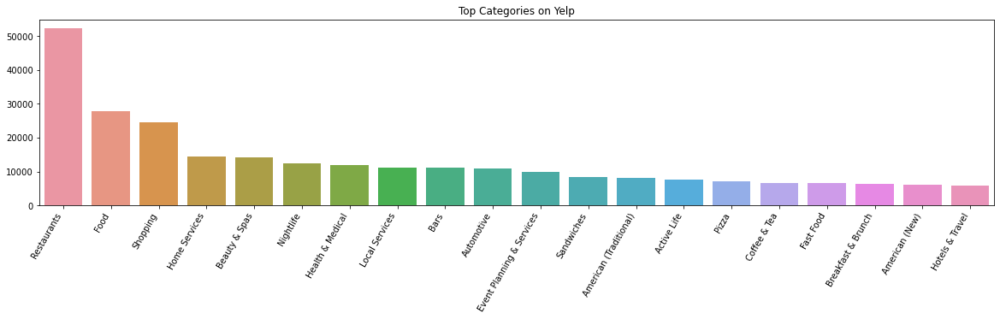

In [5]:
business_cats = ",".join(business["categories"].dropna())
cats = pd.DataFrame(business_cats.split(","), columns=['category'])
cats['category'] = cats['category'].str.strip()
x = cats.category.value_counts()
x = x.iloc[0:20]

plt.figure(figsize=(20,4))
ax = sns.barplot(x=x.index, y=x.values)
plt.title("Top Categories on Yelp")
ax.set_xticklabels(x.index, rotation=60, ha='right')
plt.xticks(rotation=60)
plt.show()

Restaurants is the top category in this dataset, and we'll restrict our analysis to this category.

# Business - Restaurant Map

We'll use the `basemap` module to map the restaurant locations in this dataset.

In [6]:
restaurant = business[business["categories"].notna()]
restaurant = restaurant[restaurant["categories"].str.contains("Restaurants")]

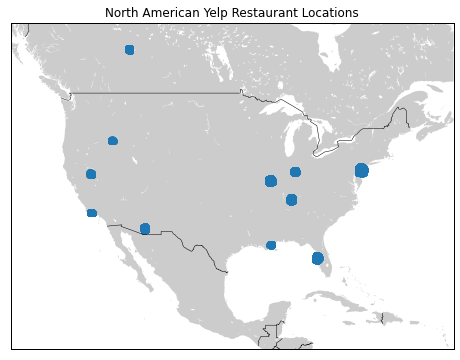

In [7]:
plt.figure(figsize=(12,6))

lon_min, lon_max = -133, -60
lat_min, lat_max = 14, 56

mask_NA = (restaurant["latitude"]>lat_min) &\
            (restaurant["latitude"]<lat_max) &\
            (restaurant["longitude"]>lon_min) &\
            (restaurant["longitude"]<lon_max)
restaurant_NA = restaurant[mask_NA]
m1 = Basemap(projection='merc',
              llcrnrlon=lon_min,
              llcrnrlat=lat_min,
              urcrnrlon=lon_max,
              urcrnrlat=lat_max,
             resolution='i')

m1.fillcontinents()
m1.drawmapboundary()
m1.drawcountries()
x, y = m1(restaurant_NA["longitude"], restaurant_NA['latitude'])
m1.scatter(x, y)
plt.title("North American Yelp Restaurant Locations")
plt.show()

The businesses in this dataset are restricted to 11 metropolitan areas in North America.

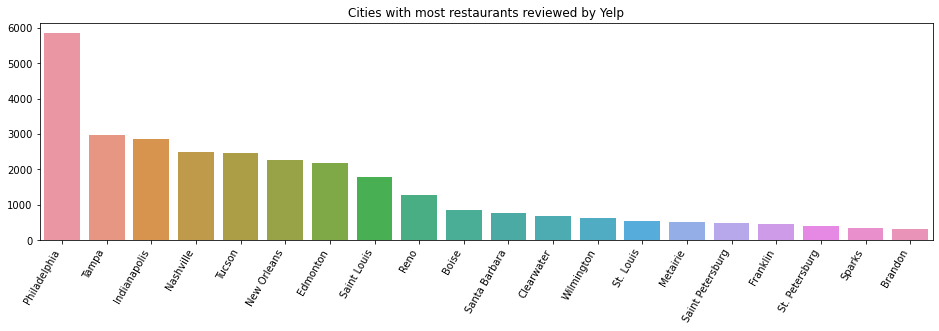

In [8]:
x = restaurant["city"].value_counts()
x = x.iloc[:20]
plt.figure(figsize=(16,4))
ax = sns.barplot(x=x.index, y=x.values)
ax.set_xticklabels(x.index, rotation=60, ha='right')
plt.title("Cities with most restaurants reviewed by Yelp")
plt.show()

We'll restrict our analysis to Philadelphia restaurants, as it's the largest subset.

We'll plot a map of where the restaurants in the city are located.

In [9]:
ratings = restaurant[["name","city","latitude","longitude","stars","review_count"]]
ratings

,name,city,latitude,longitude,stars,review_count
3,St Honore Pastries,Philadelphia,39.955505,-75.155564,4.0,80
5,Sonic Drive-In,Ashland City,36.269593,-87.058943,2.0,6
8,Tsevi's Pub And Grill,Affton,38.565165,-90.321087,3.0,19
9,Sonic Drive-In,Nashville,36.208102,-86.768170,1.5,10
11,Vietnamese Food Truck,Tampa Bay,27.955269,-82.456320,4.0,10
...,...,...,...,...,...,...
150325,Wawa,Clifton Heights,39.925656,-75.310344,3.0,11
150327,Dutch Bros Coffee,Boise,43.615401,-116.284689,4.0,33
150336,Adelita Taqueria & Restaurant,Philadelphia,39.935982,-75.158665,4.5,35
150339,The Plum Pit,Aston,39.856185,-75.427725,4.5,14


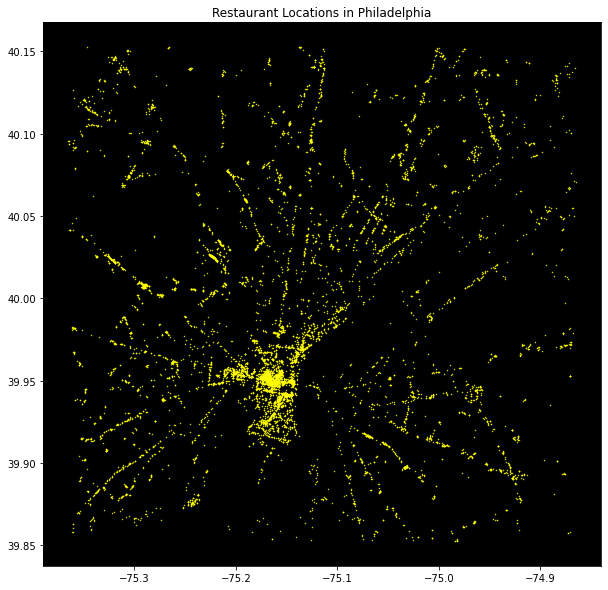

In [10]:
fig, ax = plt.subplots(figsize=(10, 10))

phi_lat, phi_lon = 39.9526, -75.1652
lon_min, lon_max = phi_lon - .2, phi_lon + .3
lat_min, lat_max = phi_lat - .1, phi_lat + .2

phi_mask = (restaurant['longitude']>lon_min) &\
            (restaurant['longitude']<lon_max) &\
            (restaurant['latitude']>lat_min) &\
            (restaurant['latitude']<lat_max)

phi_restaurant = restaurant[phi_mask]

ax.scatter(
        x=phi_restaurant['longitude'], 
        y=phi_restaurant['latitude'],
        c='yellow',
        s=0.2
        )
ax.set_title("Restaurant Locations in Philadelphia")
ax.set_facecolor('black')
plt.show()

Are the restaurants clustered by quality at all? Do the good restaurants in Philadelphia belong to a certain area, and vice versa? We'll use `folium` to plot markers for each restaurant, color-coded by the number of stars they have on Yelp.

In [11]:
import folium

In [12]:
rest_lat = phi_restaurant['latitude']
rest_lon = phi_restaurant['longitude']
rest_name = phi_restaurant['name']

phi_restaurant['marker_colour'] = pd.cut(phi_restaurant['stars'],bins=4,
                                        labels=['red','yellow','green','blue'])
rest_colour = phi_restaurant['marker_colour']

/tmp/ipykernel_1192/1779387711.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  phi_restaurant['marker_colour'] = pd.cut(phi_restaurant['stars'],bins=4,


In [13]:
m = folium.Map(location=[phi_lat, phi_lon])

feature_group = folium.FeatureGroup("Locations")
for lat, lng, name, color in zip(rest_lat, rest_lon, rest_name, rest_colour):
    feature_group.add_child(folium.CircleMarker(location=[lat,lng], popup=name,
                                               color=color, radius=3))

m.add_child(feature_group)

It seems to be randomly distributed, though the low-quality red markers look a bit rarer near the downtown core.

# Users

One thing that's interesting to investigate is the Pareto principle: roughly 80% of the consequences come from 20% of the causes (the 'vital few'). We'll take a look at the review counts of users in the dataset, and see if the Pareto principle holds.

In [14]:
user.head()

,user_id,name,review_count,yelping_since,useful,funny,cool,elite,friends,fans,...,compliment_more,compliment_profile,compliment_cute,compliment_list,compliment_note,compliment_plain,compliment_cool,compliment_funny,compliment_writer,compliment_photos
0,qVc8ODYU5SZjKXVBgXdI7w,Walker,585,2007-01-25 16:47:26,7217,1259,5994,2007,"NSCy54eWehBJyZdG2iE84w, pe42u7DcCH2QmI81NX-8qA...",267,...,65,55,56,18,232,844,467,467,239,180
1,j14WgRoU_-2ZE1aw1dXrJg,Daniel,4333,2009-01-25 04:35:42,43091,13066,27281,"2009,2010,2011,2012,2013,2014,2015,2016,2017,2...","ueRPE0CX75ePGMqOFVj6IQ, 52oH4DrRvzzl8wh5UXyU0A...",3138,...,264,184,157,251,1847,7054,3131,3131,1521,1946
2,2WnXYQFK0hXEoTxPtV2zvg,Steph,665,2008-07-25 10:41:00,2086,1010,1003,"2009,2010,2011,2012,2013","LuO3Bn4f3rlhyHIaNfTlnA, j9B4XdHUhDfTKVecyWQgyA...",52,...,13,10,17,3,66,96,119,119,35,18
3,SZDeASXq7o05mMNLshsdIA,Gwen,224,2005-11-29 04:38:33,512,330,299,"2009,2010,2011","enx1vVPnfdNUdPho6PH_wg, 4wOcvMLtU6a9Lslggq74Vg...",28,...,4,1,6,2,12,16,26,26,10,9
4,hA5lMy-EnncsH4JoR-hFGQ,Karen,79,2007-01-05 19:40:59,29,15,7,,"PBK4q9KEEBHhFvSXCUirIw, 3FWPpM7KU1gXeOM_ZbYMbA...",1,...,1,0,0,0,1,1,0,0,0,0


In [15]:
user.size

43733734

This is a massive dataset. We'll pare it down to the more interesting users with more than 10 reviews.

In [16]:
active_user = user[user["review_count"] > 10]
active_user.size

15003032

In [17]:
active_user = active_user.sort_values("review_count", ascending=False).reset_index(drop=True)

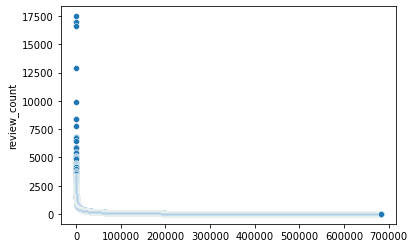

In [18]:
sns.scatterplot(x=active_user.index, y=active_user["review_count"])
plt.show()

Extremely positively skewed. It looks like a heavy contribution to the review total comes from a small percentage of the users.

We'll split the reviews into decile ranges.

In [19]:
dec = (
    active_user["review_count"]
    .groupby(pd.qcut(active_user["review_count"], q=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, .9, 1]))
    .agg(['sum', 'count'])
)

In [20]:
dec

,sum,count
review_count,,
"(10.999, 12.0]",852360,74287
"(12.0, 15.0]",1209565,86770
"(15.0, 17.0]",751938,45627
"(17.0, 21.0]",1393679,71833
"(21.0, 26.0]",1560280,65377
"(26.0, 34.0]",2142565,70889
"(34.0, 46.0]",2628642,65747
"(46.0, 69.0]",3779114,66788
"(69.0, 129.0]",6273845,66934


Now we calculate the cumulative sum of the `sum` and `count` columns we've created, and normalize to get a sense for each decile's contribution to the review total.

In [21]:
dec = dec.reset_index()
dec["review_count"] = dec["review_count"].astype(str)

In [22]:
dec["cumsum"] = dec["sum"].cumsum() / dec["sum"].sum() * 100
dec["cumcount"] = dec["count"].cumsum() / dec["count"].sum() * 100

In [23]:
dec

,review_count,sum,count,cumsum,cumcount
0,"(10.999, 12.0]",852360,74287,2.040863,10.893225
1,"(12.0, 15.0]",1209565,86770,4.937005,23.616920
2,"(15.0, 17.0]",751938,45627,6.737421,30.307527
3,"(17.0, 21.0]",1393679,71833,10.074400,40.840905
4,"(21.0, 26.0]",1560280,65377,13.810283,50.427594
5,"(26.0, 34.0]",2142565,70889,18.940370,60.822546
6,"(34.0, 46.0]",2628642,65747,25.234304,70.463490
7,"(46.0, 69.0]",3779114,66788,34.282891,80.257084
8,"(69.0, 129.0]",6273845,66934,49.304779,90.072087
9,"(129.0, 17473.0]",21172702,67704,100.000000,100.000000


Over 50% of the reviews come from the top 10% of users on Yelp!

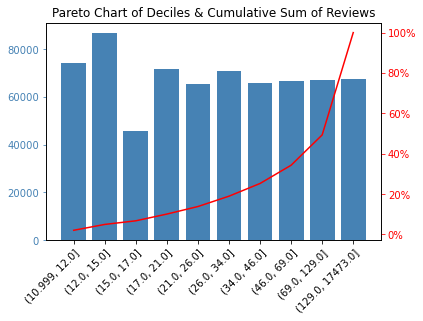

In [24]:
fig, ax = plt.subplots()
ax.bar(dec['review_count'], dec['count'], color="steelblue")
ax2 = ax.twinx()
ax2.plot(dec['review_count'], dec['cumsum'], color='red')
ax2.yaxis.set_major_formatter(PercentFormatter())
ax.tick_params(axis='y', colors='steelblue')
ax2.tick_params(axis='y', colors='red')

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

plt.title("Pareto Chart of Deciles & Cumulative Sum of Reviews")
plt.show()

# User Networks

This is quite a large dataset, too big to fit into memory. We'll take a subset of just the active users from Philadelphia. Then we'll use `networkx` to create network graphs of the connections between users.

In [25]:
phi_review = pd.merge(phi_restaurant,review,how='inner',on='business_id')
phi_user = phi_review["user_id"].unique()
phi_user = user[user["user_id"].isin(phi_user)]

active_mask = (phi_user["review_count"]>10) &\
                (phi_user["friends"] != "None")

active_phi_user = phi_user[active_mask]

We'll just take the top 10,000 users to reduce computation time & memory requirements.

In [26]:
active_phi_user['friends_list'] = active_phi_user["friends"].apply(lambda x: x.split(','))
active_phi_user = active_phi_user[["user_id","friends_list"]]
subset = active_phi_user.iloc[:10000]

/tmp/ipykernel_1192/1792382883.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  active_phi_user['friends_list'] = active_phi_user["friends"].apply(lambda x: x.split(','))


We'll create an edge list formatted for a `networkx` graph.

In [27]:
edge_list = subset.set_index(["user_id"])["friends_list"].apply(pd.Series)

In [28]:
edge_list = edge_list.stack().reset_index()

In [29]:
edge_list = edge_list.drop(['level_1'], axis=1)
edge_list.columns = ["source", "target"]
edge_list.head()

,source,target
0,qVc8ODYU5SZjKXVBgXdI7w,NSCy54eWehBJyZdG2iE84w
1,qVc8ODYU5SZjKXVBgXdI7w,pe42u7DcCH2QmI81NX-8qA
2,qVc8ODYU5SZjKXVBgXdI7w,EjlCGf14tYMPJ0rsrL703w
3,qVc8ODYU5SZjKXVBgXdI7w,7OagHIAKx2Rm9z3CQ0OmvA
4,qVc8ODYU5SZjKXVBgXdI7w,uZoFvKs0dahfffIqHQf1eA


In [30]:
len(edge_list["target"].unique())

929965

In [31]:
graph = nx.from_pandas_edgelist(edge_list)

In [32]:
print(nx.info(graph))

/tmp/ipykernel_1192/3581210431.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(graph))


Graph with 939021 nodes and 1901048 edges


In [33]:
nx.density(graph)

4.311942204763234e-06

Quite a sparse graph.

We can't handle 939,021 nodes, so we'll cut it down to the top 10,000 nodes, ordered by their degree of centrality.

In [34]:
centrality = nx.degree_centrality(graph)
power_users = heapq.nlargest(10000, centrality, key=centrality.get)
power_users_graph = graph.subgraph(power_users)

print(nx.info(power_users_graph))

In [38]:
nx.density(power_users_graph)

0.00596083608360836

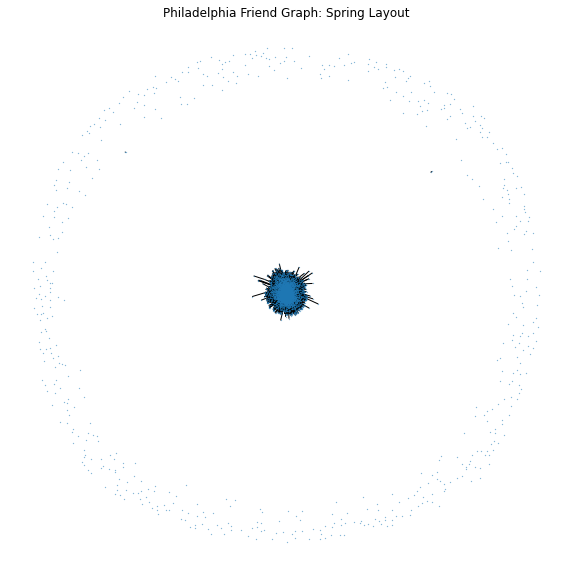

In [39]:
spring = nx.spring_layout(power_users_graph)

plt.figure(figsize=(10, 10))
plt.title("Philadelphia Friend Graph: Spring Layout")
nx.draw(power_users_graph, pos=spring, node_size=0.05, width=1)

Lots of isolates still remaining. We'll remove them and show the graph again.

In [40]:
nodes_to_remove = [x for x in nx.isolates(power_users_graph)]
graph.remove_nodes_from(nodes_to_remove)

power_users_graph = graph.subgraph(power_users)

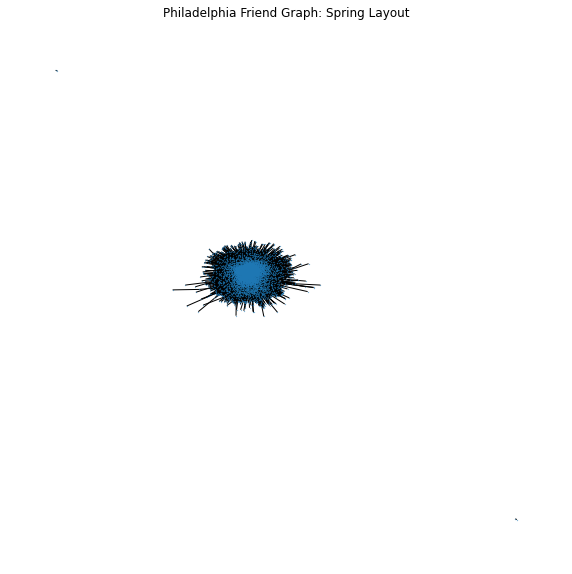

In [41]:
spring = nx.spring_layout(power_users_graph)

plt.figure(figsize=(10, 10))
plt.title("Philadelphia Friend Graph: Spring Layout")
nx.draw(power_users_graph, pos=spring, node_size=0.05, width=1)

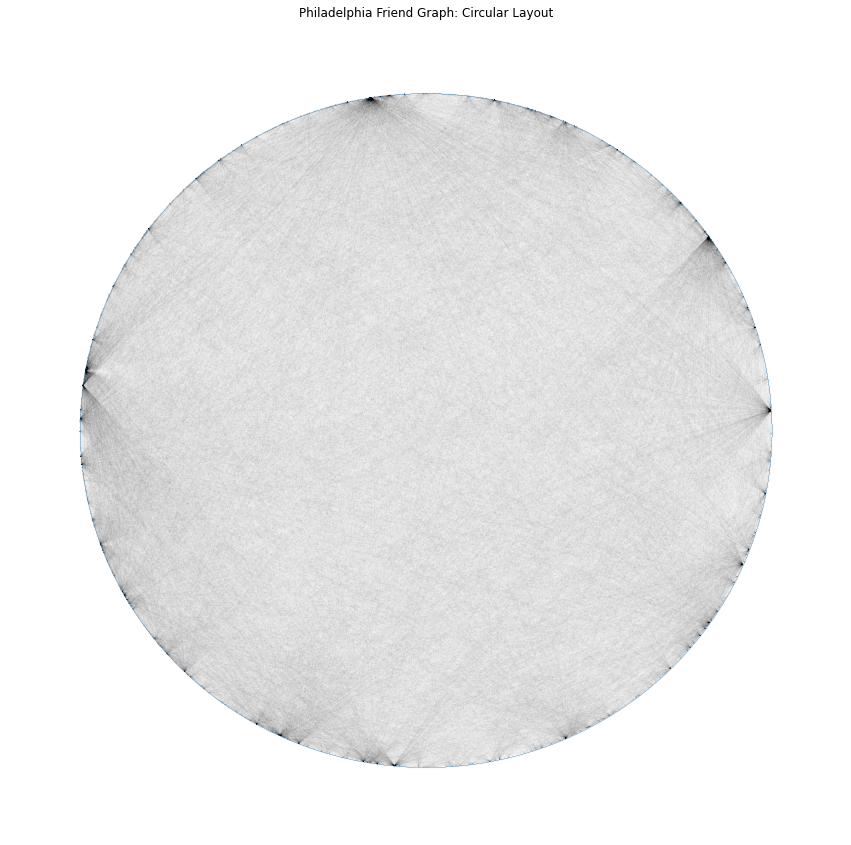

In [42]:
circular = nx.circular_layout(power_users_graph)

plt.figure(figsize=(15, 15))
plt.title("Philadelphia Friend Graph: Circular Layout")
nx.draw(power_users_graph, pos=circular, node_size=.001, width=.0002)